# Example `Dysmalpy` 3D fitting, using fitting wrapper

**Includes the following components:**

 - Disk + Bulge
 - NFW halo
 - Constant velocity dispersion

## Setup steps ##

**Import modules**

In [1]:
from __future__ import (absolute_import, division, print_function,
                        unicode_literals)

from dysmalpy.fitting_wrappers import dysmalpy_fit_single_3D
from dysmalpy.fitting_wrappers import utils_io
from dysmalpy import fitting

import os

import numpy as np

**Setup notebook**

In [2]:
# Setup plotting
import matplotlib.pyplot as plt
%matplotlib inline

from IPython.core.display import Image

**Set data, output paths**

- Note this will override the `datadir` and `outdir` specified in the param file. 

    * *(This is useful for the example here. When running from command line, it's recommended to properly set the directories in the param file.)*

In [3]:
# Data directory
datadir = '/Users/sedona/data/dysmalpy_example_data/'
#'/YOUR/DATA/PATH/'

# Where to save output files
outdir = '/Users/sedona/data/dysmalpy_test_examples/JUPYTER_OUTPUT_3D_FITTING_WRAPPER/'
outdir_mpfit = outdir + 'MPFIT/'

param_filename = '/Users/sedona/data/dysmalpy_test_examples/fitting_3D_mpfit.params'

-------------------

**Settings in parameter file:**

In [4]:
with open(param_filename, 'r') as f:
    print(f.read())

# Example parameters file for fitting a single object with 1D data
# Note: DO NOT CHANGE THE NAMES IN THE 1ST COLUMN AND KEEP THE COMMAS!!
# See README for a description of each parameter and its available options.

# ******************************* OBJECT INFO **********************************
galID,    GS4_43501    # Name of your object
z,        1.613        # Redshift

# ****************************** DATA INFO *************************************


#datadir,          None                                   # Optional: Full path to data directory.
datadir,   /Users/sedona/data/dysmalpy_example_data/

fdata_cube,           gs4-43501_h250_21h30.fits.gz   # Full path to vel map. Alternatively, just the filename if 'datadir' is set.
fdata_err,            noise_gs4-43501_h250_21h30.fits.gz    # Full path to vel. err map. Alternatively, just the filename if 'datadir' is set.
fdata_mask,           GS4_43501_mask.fits   # Full path to mask 
#                                               

**Add some settings for this notebook example:**

In [5]:
plot_type = 'png'

--------

## Generate mask for this IFU cube ##

As we don't have a premade mask for the data cube, we will use an automated script to generate a mask. 

This script can <span style="color:DarkCyan">***mask skylines***</span> (based on the spectral variance spectrum), as well as applying a <span style="color:DarkCyan">***segmentation map***</span> to limit the fitting to a contiguous region based on the integrated line flux. 

**Load parameters and galaxy**

In [6]:
params = utils_io.read_fitting_params(fname=param_filename)
gal = utils_io.load_galaxy(params=params, datadir=datadir, skip_automask=True)

INFO:DysmalPy:dysmalpy.Galaxy:
********************************************************************
*** INFO ***
instrument.fov[0,1]=(37,37) is being reset to match 3D cube (31, 31)
********************************************************************

INFO:DysmalPy:dysmalpy.Galaxy:
********************************************************************
*** INFO ***
instrument spectral settings are being reset
   (spec_type=velocity, spec_start=-1000.00 km / s, spec_step=10.00 km / s, nspec=201)
   to match 3D cube
   (spec_type=velocity, spec_start=-484.72 km / s, spec_step=34.08 km / s, nspec=29)
********************************************************************



Note that any mismatches in the instrument FOV or spectral settings have been automatically set, and reset to match the input data cube.

**Generate mask**

In [7]:
mask, mask_dict = utils_io.generate_3D_mask(gal=gal, params=params) 

++++++++++++++++++++++++++++++++++++++++++++++++++++++
  Creating 3D auto mask with the following settings: 
        sig_segmap_thresh   = 3 
        npix_segmap_min     = 5 
        snr_int_flux_thresh = 3 
        snr_thresh_pixel    = None 
        sky_var_thresh      = 2 
        apply_skymask_first = True 
++++++++++++++++++++++++++++++++++++++++++++++++++++++

 Masking segmap: used exclude_percentile=15.0


Note that we set the relevant parameters (`sig_segmap_thresk`, `npix_segmap_min`, `sky_var_thresh`, etc.) in the parameters file, by prepending `auto_gen_mask_` to the keyword names.

These parameters (`sig_segmap_thresk`, `npix_segmap_min`, `sky_var_thresh`, etc.) can also be <span style="color:FireBrick">_passed directly_</span> to `utils_io.generate_3D_mask()`, which can be helpful when exploring different parameter settings.

**Examine mask info**

First look at the integrated spatial flux maps and segmaps

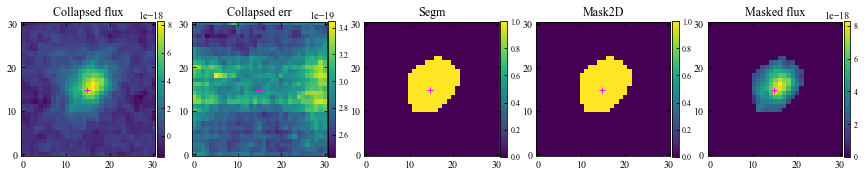

In [8]:
plotting.plot_3D_data_automask_info(gal, mask_dict)

Then examine the per-spaxel spectra, to see if the skyline masking/velocity cropping and the segmentation map masking is sufficient.

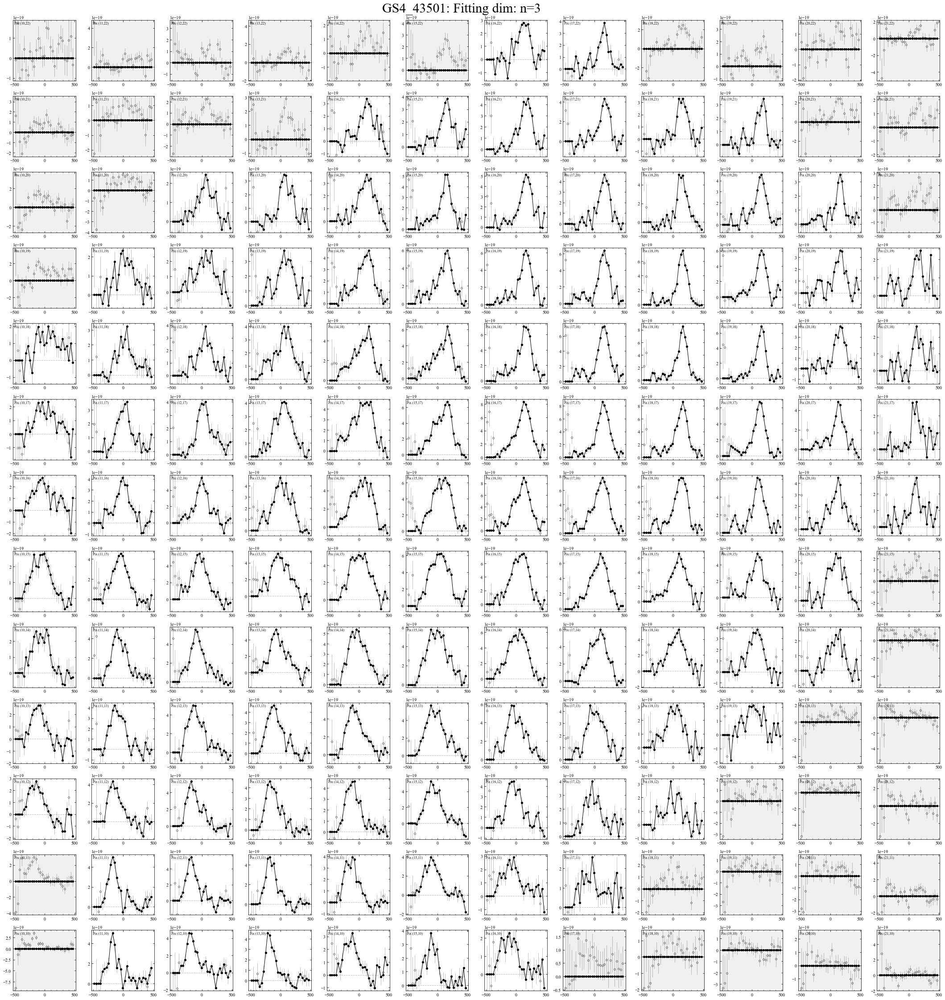

In [9]:
gal.data.mask = np.array(mask, dtype=np.bool)
plotting.plot_spaxel_compare_3D_cubes(gal, skip_fits=True)

**Save mask**

After finalizing the parameters, save a copy of the mask to a FITS file (to the filename specified with `fdata_mask` in the params file).

Note we will backmap the mask to the uncropped cube size, so the raw data and error cubes can be directly compared to raw mask file. (The same cropping will be applied to the data, error, and mask cubes when loading the data for fitting.)

In [10]:
utils_io.save_3D_mask(gal=gal, mask=mask, filename=datadir+params['fdata_mask'], 
                        overwrite=False, save_uncropped_size=True)

Note that we set the relevant parameters (`sig_segmap_thresk`, `npix_segmap_min`, `sky_var_thresh`, etc.) in the parameters file. 

If `fdata_mask` is not set in the param file, or if the file is not found, then when running the fitting wrapper the behavior will fall back to creating a mask on the fly (as by default `skip_automask=False`). 

In this case, the automatic mask generation uses the specified automask parameters in the param file (or else falls back to the automask defaults, if not specified).

However, if the mask is generated on the fly, it will not be saved to a separate FITS file (though it will be accessible in the `galaxy` object stored in the "galaxy model" pickle).

For this example, we choose to directly save the mask to a FITS file, for clarity.

--------

## Run `Dysmalpy` fitting: 3D wrapper, with fit method= MPFIT ##

In [11]:
dysmalpy_fit_single_3D.dysmalpy_fit_single_3D(param_filename=param_filename, 
                                    datadir=datadir, outdir=outdir_mpfit,
                                    plot_type=plot_type)

INFO:DysmalPy:dysmalpy.Galaxy:
********************************************************************
*** INFO ***
instrument.fov[0,1]=(37,37) is being reset to match 3D cube (31, 31)
********************************************************************

INFO:DysmalPy:dysmalpy.Galaxy:
********************************************************************
*** INFO ***
instrument spectral settings are being reset
   (spec_type=velocity, spec_start=-1000.00 km / s, spec_step=10.00 km / s, nspec=201)
   to match 3D cube
   (spec_type=velocity, spec_start=-484.72 km / s, spec_step=34.08 km / s, nspec=29)
********************************************************************

INFO:DysmalPy:*************************************
INFO:DysmalPy: Fitting: GS4_43501 using MPFIT
INFO:DysmalPy:
mvirial_tied: <function tie_lmvirial_NFW at 0x1a26f50a60>
INFO:DysmalPy:nSubpixels: 1
INFO:DysmalPy:
MPFIT Fitting:
Start: 2021-06-11 13:33:11.623944

INFO:DysmalPy:Iter 1  CHI-SQUARE = 6702.485268  DOF = 27863
   d

plot_model_multid: ndim=3: moment=False
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours


------

## Examine results ##

**List all saved files in output directory:**

In [12]:
for f in os.listdir(outdir_mpfit): print(f)

GS4_43501_apertures.png
GS4_43501_channel.png
GS4_43501_fitting_3D_mpfit.params
GS4_43501_galaxy_bestfit_menc.dat
GS4_43501_galaxy_bestfit_vcirc.dat
GS4_43501_galaxy_bestfit_vel_profile.dat
GS4_43501_galaxy_model.pickle
GS4_43501_info.log
GS4_43501_mpfit_best_fit.png
GS4_43501_mpfit_best_fit_results.dat
GS4_43501_mpfit_best_fit_results_report.info
GS4_43501_mpfit_bestfit_model_cube.fits
GS4_43501_mpfit_results.pickle
GS4_43501_out-cube.fits
GS4_43501_spaxels.png


### Result plots ###

**Read in parameter file**

In [13]:
params = utils_io.read_fitting_params(fname=param_filename)

# Override data + output paths:
params['datadir'] = datadir
params['outdir'] = outdir_mpfit

# Add the plot type:
params['plot_type'] = plot_type

f_galmodel = params['outdir'] + '{}_galaxy_model.pickle'.format(params['galID'])
f_results =  params['outdir'] + '{}_{}_results.pickle'.format(params['galID'], 
                                                        params['fit_method'])

**Best-fit plot (extracted to 1D circular apertures and 2D maps):**

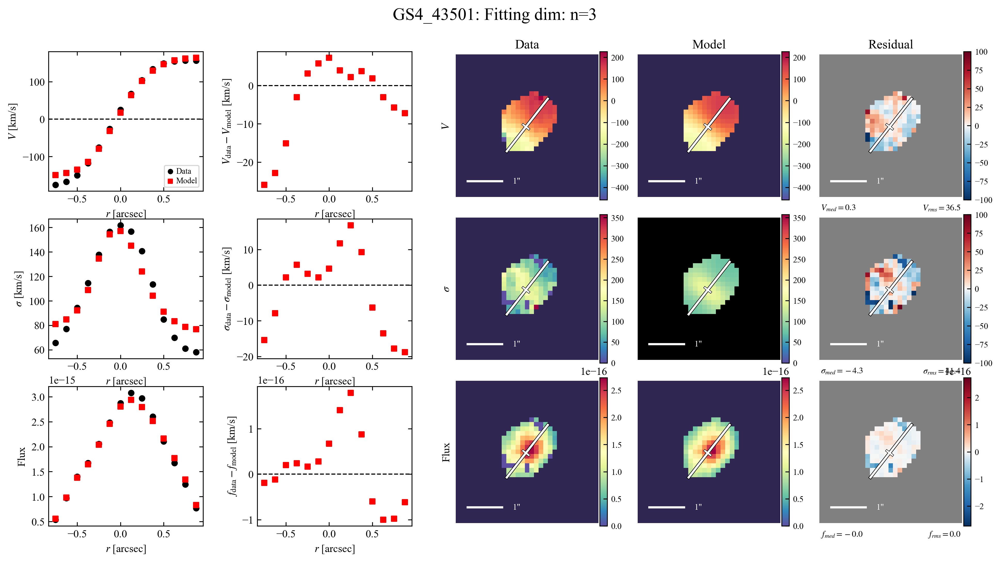

In [14]:
# Look at best-fit:
filepath = outdir_mpfit+"{}_mpfit_best_fit.{}".format(params['galID'], params['plot_type'])
Image(filename=filepath, width=600)

**LOS velocity distribution in each of the 1D circular apertures:**

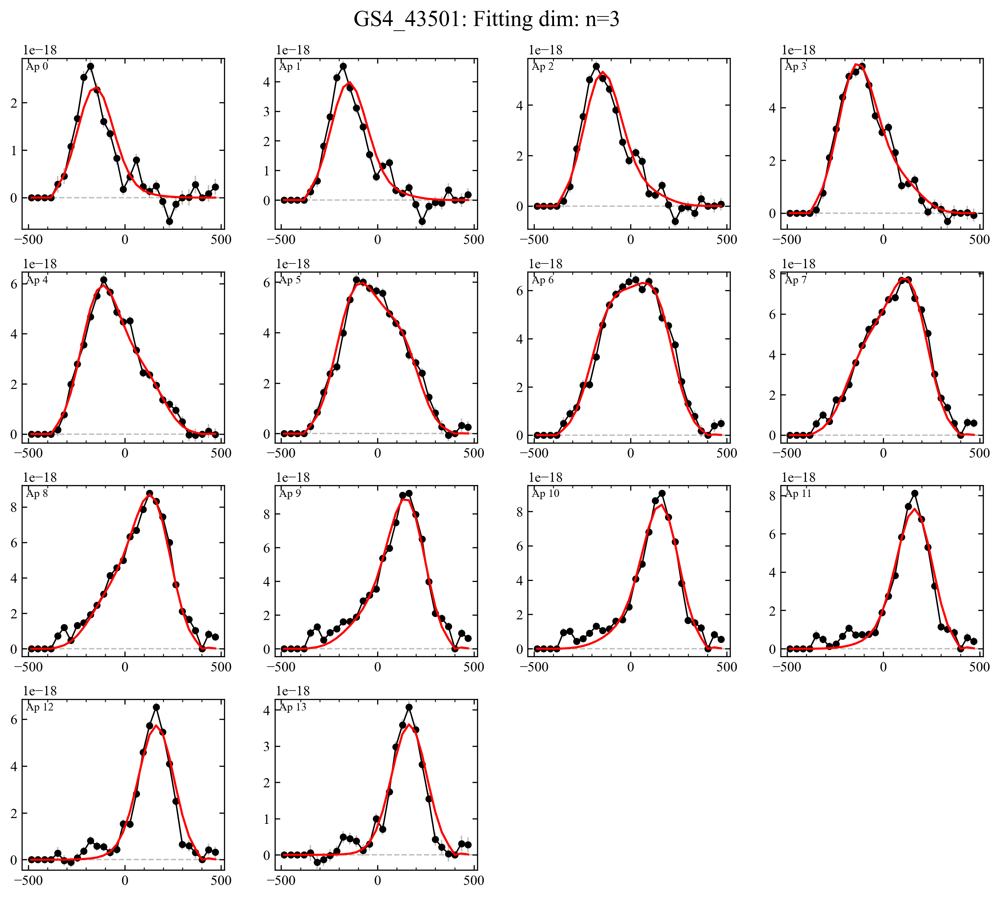

In [15]:
# Look at per-aperture profiles:
filepath = outdir_mpfit+"{}_apertures.{}".format(params['galID'], params['plot_type'])
Image(filename=filepath, width=600)

**LOS velocity distribution in each spaxel:**

In [16]:
# Look at per-spaxel profiles:
filepath = outdir_mpfit+"{}_spaxels.{}".format(params['galID'], params['plot_type'])
Image(filename=filepath, width=600)

**Channel maps:**

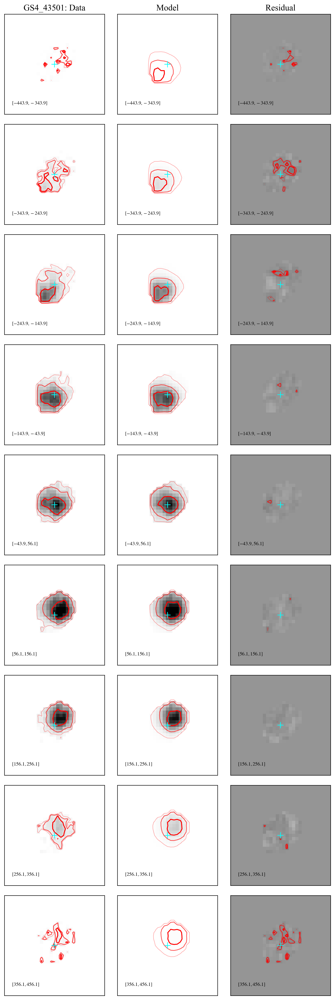

In [17]:
# Look at channel maps:
filepath = outdir_mpfit+"{}_channel.{}".format(params['galID'], params['plot_type'])
Image(filename=filepath, width=600)

#### Directly generating result plots ####

**Reload the galaxy, results files:**

In [18]:
gal, results = fitting.reload_all_fitting(filename_galmodel=f_galmodel, 
                        filename_results=f_results, fit_method=params['fit_method'])

**Plot the best-fit results:**

plot_model_multid: ndim=3: moment=False


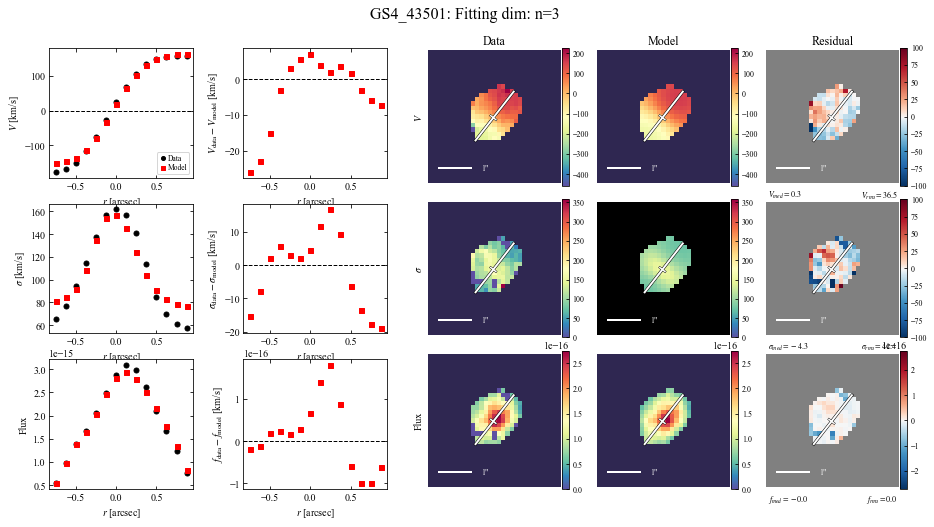

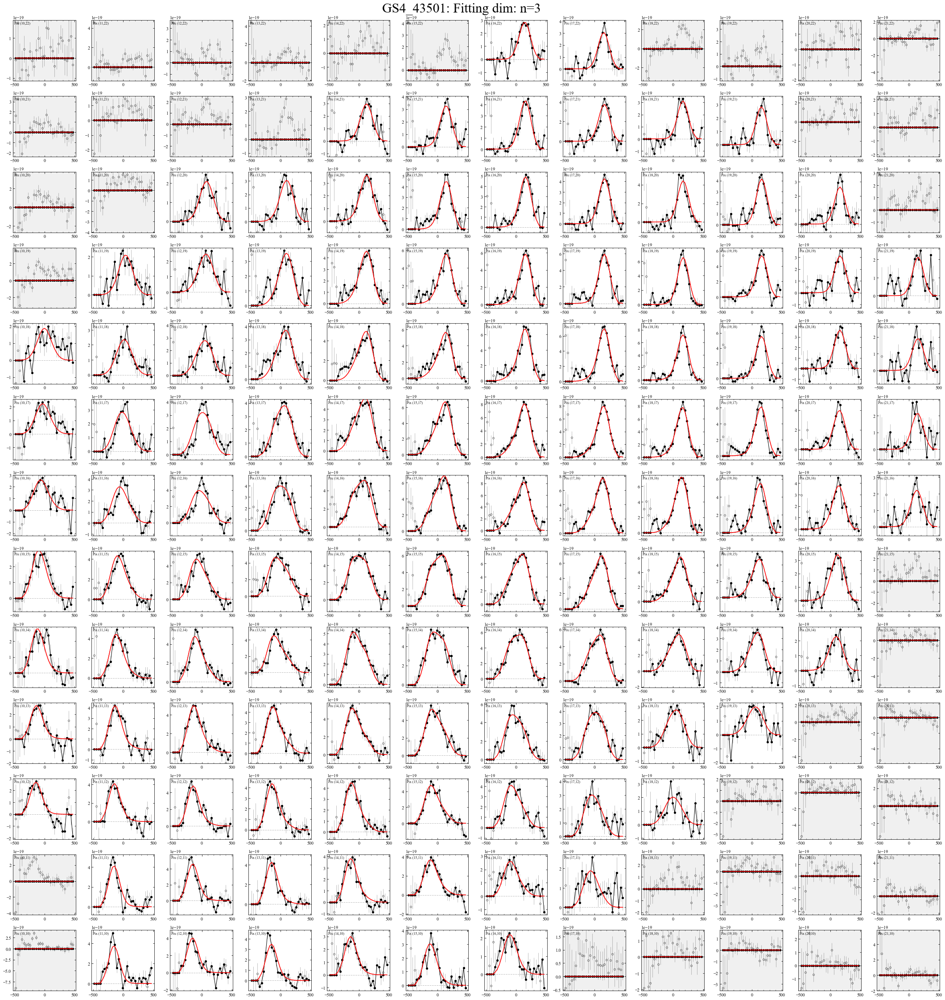

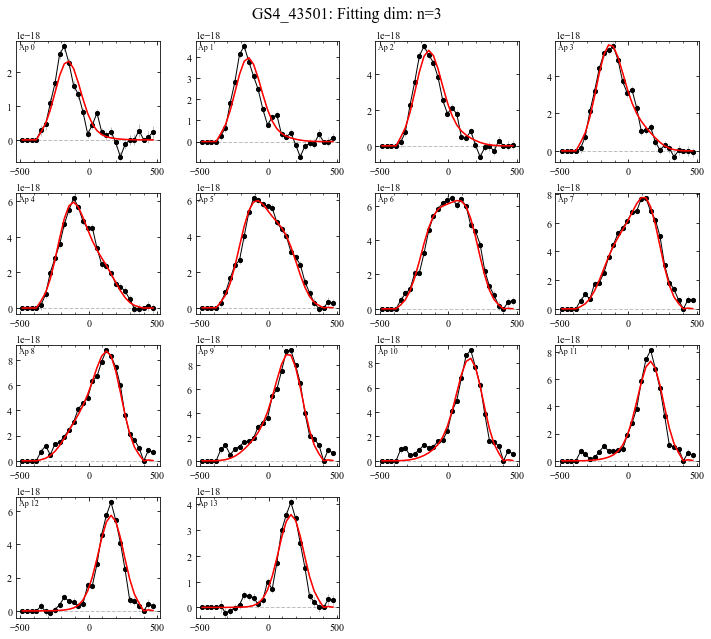

Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours


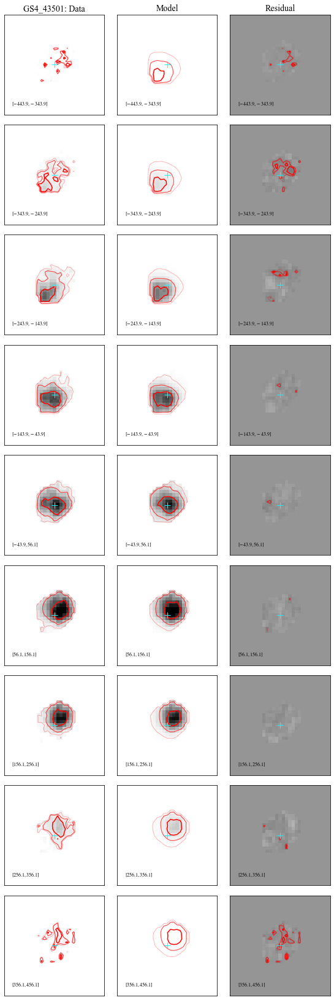

In [19]:
%matplotlib inline
results.plot_results(gal, fitdispersion=params['fitdispersion'], 
                          oversample=params['oversample'], 
                          oversize=params['oversize'])

--------

### Results reports ###

We now look at the results reports, which include the best-fit values and uncertainties (as well as other fitting settings and output).

In [20]:
# Print report
print(results.results_report(gal=gal))

###############################
 Fitting for GS4_43501

Date: 2021-06-11 13:39:18.309478


Fitting method: MPFIT

zcalc_truncate:        [Default: True]
n_wholepix_z_min:      [Default: 3]
oversample:            [Default: 1]
oversize:              [Default: 1]

pressure_support:      True
pressure_support_type: 1

###############################
 Fitting results
-----------
 disk+bulge
    total_mass       10.7849  +/-   0.0369
    r_eff_disk        2.8063  +/-   0.1389
    bt                0.1197  +/-   0.0339

    n_disk            1.0000  [FIXED]
    r_eff_bulge       1.0000  [FIXED]
    n_bulge           4.0000  [FIXED]

    noord_flat        True
-----------
 halo
    fdm               0.2296  +/-   0.0423

    mvirial          12.4410  [TIED]
    conc              5.0000  [FIXED]
-----------
 dispprof
    sigma0           67.7529  +/-   1.5874
-----------
 zheightgaus
    sigmaz            0.4767  [TIED]
-----------
 geom
    vel_shift         6.1025  +/-   0.8390

    inc      

**To <span style="color:DarkCyan">directly save</span> the results report** to a file, we can use the following:

In [21]:
# Save report to file:
f_report = params['outdir'] + '{}_fit_report.txt'.format(params['galID'])
results.results_report(gal=gal, filename=f_report)

**Also note the fitting wrappers automatically save two versions of the report files:**

In [22]:
f_report_pretty =   params['outdir'] + '{}_{}_best_fit_results_report.info'.format(params['galID'], 
                                                            params['fit_method'])
f_report_machine =  params['outdir'] + '{}_{}_best_fit_results.dat'.format(params['galID'], 
                                                            params['fit_method'])

The "pretty" version, automatically saved as `*_best_fit_results_report.info`, is formatted to be human-readable, and includes more information on the fit settings at the beginning (for reference).

In [23]:
with open(f_report_pretty, 'r') as f:
    lines = [line.rstrip() for line in f]
    for line in lines: print(line)

###############################
 Fitting for GS4_43501

Date: 2021-06-11 13:37:58.018031

Paramfile: fitting_3D_mpfit.params

Fitting method: MPFIT

fitdispersion:         True
fitflux:               False

zcalc_truncate:        [Default: True]
n_wholepix_z_min:      [Default: 3]
oversample:            1
oversize:              1

pressure_support:      True
pressure_support_type: 1

###############################
 Fitting results
-----------
 disk+bulge
    total_mass       10.7849  +/-   0.0369
    r_eff_disk        2.8063  +/-   0.1389
    bt                0.1197  +/-   0.0339

    n_disk            1.0000  [FIXED]
    r_eff_bulge       1.0000  [FIXED]
    n_bulge           4.0000  [FIXED]

    noord_flat        True
-----------
 halo
    fdm               0.2296  +/-   0.0423

    mvirial          12.4410  [TIED]
    conc              5.0000  [FIXED]
-----------
 dispprof
    sigma0           67.7529  +/-   1.5874
-----------
 zheightgaus
    sigmaz            0.4767  [TIED]
----

The "machine" version, automatically saved as `*_best_fit_results.dat`, is formatted as a machine-readable space-separated ascii file. It includes key parameter fit information, as well as the best-fit reduced chisq.

In [24]:
with open(f_report_machine, 'r') as f:
    lines = [line.rstrip() for line in f]
    for line in lines: print(line)

# component             param_name    fixed       best_value   l68_err     u68_err
disk+bulge              total_mass    False        10.7849      0.0369      0.0369
disk+bulge              r_eff_disk    False         2.8063      0.1389      0.1389
disk+bulge              n_disk        True          1.0000    -99.0000    -99.0000
disk+bulge              r_eff_bulge   True          1.0000    -99.0000    -99.0000
disk+bulge              n_bulge       True          4.0000    -99.0000    -99.0000
disk+bulge              bt            False         0.1197      0.0339      0.0339
halo                    mvirial       TIED         12.4410    -99.0000    -99.0000
halo                    fdm           False         0.2296      0.0423      0.0423
halo                    conc          True          5.0000    -99.0000    -99.0000
dispprof                sigma0        False        67.7529      1.5874      1.5874
zheightgaus             sigmaz        TIED          0.4767    -99.0000    -99.0000
geom